# CIS6800: Project 3: SOLO and FPN (Instance Segmentation)
### Due:
* Part (a) Oct. 1 at 11:59 p.m.
* Part (b) Oct. 8 at 11:59 p.m.

### Instructions:
* This is a group assignment with one submission per group. It is expected that each member of the group will contribute to solving each question. Be sure to specify your teammates when you submit to Gradescope! Collaborating with other groups is not permitted.
* There is no single answer to most problems in deep learning, therefore the questions will often be underspecified. You need to fill in the blanks and submit a solution that solves the (practical) problem. Document the choices (hyperparameters, features, neural network architectures, etc.) you made where specified.
* All the code should be written in Python.
* You may include any code used in previous projects. You may use ChatGPT, but you need to document how you use it.
* You should expect that a complete training session should last about 6 hours, so you should start part (b) as early as you can!
* To save on compute time, we debugging locally and using colab to train. Or use colab cpu instance for debugging
* We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so. You do not, however, need to submit your trained weights.


The SOLO paper: https://arxiv.org/pdf/1912.04488.pdf


In [1]:
# download data, you can maunally download dataset set here:
# https://drive.google.com/drive/folders/1eP7FtPaWfJ5zLdcsZYl6eyn5EYixkFn8

!gdown --id 1JD3OaHpq_4KCb7ofcPMkknmdEXFHrCcn
!gdown --id 1ssRA7yijGLFmJU-ac-lPyUOq7DYzTAS1
!gdown --id 1Rpz-ZuQxDwvLyzc0FD9GZxAKlyka3VC5
!gdown --id 1ouMFNT1thia8l6P5vcWCY-nweAexLDsB
%pip install pytorch-lightning

'gdown' is not recognized as an internal or external command,
operable program or batch file.


'gdown' is not recognized as an internal or external command,
operable program or batch file.
'gdown' is not recognized as an internal or external command,
operable program or batch file.
'gdown' is not recognized as an internal or external command,
operable program or batch file.


Note: you may need to restart the kernel to use updated packages.


In [1]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from matplotlib import patches
import copy
import torch
import torch.nn as nn
import pytorch_lightning as pl
from sklearn import metrics
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
import torch.nn.functional as F
from pytorch_lightning.loggers import tensorboard
import torchvision
import torchvision.transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import draw_bounding_boxes
from PIL import ImageColor
#from dataset import Datasetbuilder
#from dataset import visualize_raw_processor
from torch.optim.lr_scheduler import MultiStepLR
import warnings
warnings.filterwarnings("ignore")


# CUDA for PyTorch
#use_cuda = torch.cuda.is_available()
#device = torch.device("cuda:0" if use_cuda else "cpu")
#device = torch.device("cuda:0")
device = torch.device("cpu")
seed = 21
torch.manual_seed(seed);

## Code Structure
In this assignment, we are only providing the barest templates for your code structure. If you prefer, you can write and debug most of the components in a regular python and only use Jupyter to train. In this case, you might have several files that you import into this notebook, e.g.
* `dataset.py`
* `model.py`
* `train.py`
* `inference.py`

This is shown below. All files should be included in your submission.

In [ ]:
try:
    import dataset
    import model
    import train
    import inference
except ModuleNotFoundError:
    pass

In [3]:
import torch
print(f'PyTorch version: {torch.__version__}')
print('*'*10)
print(f'_CUDA version: ')
!nvcc --version
print('*'*10)
print(f'CUDNN version: {torch.backends.cudnn.version()}')
print(f'Available GPU devices: {torch.cuda.device_count()}')
print(f'Device Name: {torch.cuda.get_device_name()}')

PyTorch version: 2.1.0
**********
_CUDA version: 
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:41:10_Pacific_Daylight_Time_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
**********
CUDNN version: 8700
Available GPU devices: 1
Device Name: NVIDIA GeForce RTX 3070 Ti Laptop GPU


## Overview

Instance segmentation can be thought of as a combination of object detection and semantic segmentation, the former of which you already explored in the previous project. A visulization of this relationship can be seen in fig. 1.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig1.png" width=500/></div>
<center>Figure 1: An overview of instance segmentation.</center>  

In this project, you are tasked with implementing an instance segmentation framework know as SOLO (Segmenting Object by LOcations). In a similar manner to YOLO, SOLO produces mask predictions on a dense grid. This means that, unlike many other segmenation frameworks (e.g. Mask-RCNN), SOLO directly predicts the segmentation mask without proposing bounding box locations. An visual summary of SOLO can be seen in fig. 2 and 3.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig2.png" width=200/></div>
<center>Figure 2: SOLO.</center>  

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig3.png" width=600/></div>
<center>Figure 3: SOLO branches.</center>

These dense predictions are produced at several different scales using a Feature Pyramid Network (FPN). Using the last few layers of the backbone, we pass the higher level features from the deeper layers back up to larger features scales using lateral connections, shown in fig. 4. The integration of the FPN into your network will be the primary focus of this project.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig4.png" width=300/></div>
<center>Figure 4: SOLO branches.</center>

## Part A

### Dataset
#### Dataset Structure
The dataset used in this project contains three classes across 3265 images: vehicles, people, and animals. The dataset contains the following elements:

* A numpy array of images ($3 \times 300 \times 400$).
* A numpy array of masks ($300 \times 400$).
* A list of ground truth labels by image.
* A list of bounding boxes by image.

Note that the mask array is flattened; to determine which masks belong to which image, count the number of labels associated with that image. For example, if the first few images have 3, 2, and 4 labels, masks 0-2 would belong to image 1, masks 3-4 would belong to image 2, etc. The masks are ordered correctly to allow for this.

#### Loading and Batching
You should apply the following transformations to each image:
* Normalize pixel values to $[0,1]$.
* Rescale the image to $800 \times 1066$.
* Normalize each channel with means $[0.485, 0.456, 0.406]$ and standard deviations $[0.229, 0.224, 0.225]$.
* Zero pad the image to $800 \times 1088$.

Since each image will have a different number of objects, you will have to write your own collation function to properly batch the images. An example collate_fn is shown below, along with expected output dimensions.

In [2]:
class Datasetbuilder(Dataset):
    def __init__(self, path):
        self.images = h5py.File(path["images"],'r')['data']
        self.masks = h5py.File(path["masks"],'r')['data']
        self.bboxes = np.load(path["bboxes"], allow_pickle=True)
        self.labels = np.load(path["labels"], allow_pickle=True)

        self.matching_masks = []

        count = 0
        for i, label in enumerate(self.labels):
            n = label.shape[0]
            temp = []
            for j in range(n):
                temp.append(self.masks[count])
                count += 1
            self.matching_masks.append(temp)


        self.transform = torchvision.transforms.Compose([torchvision.transforms.Resize((800, 1066)), torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])
        self.resize = torchvision.transforms.Resize((800, 1066))
        self.pad = torch.nn.ZeroPad2d((11,11,0,0))

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, index):
        image, mask, bbox = self.pre_process_batch(self.images[index], self.matching_masks[index], self.bboxes[index])
        return image, torch.tensor(self.labels[index]), mask, bbox

    def pre_process_batch(self, image, masks, bbox):
        image_scaled = self.transform(torch.tensor(image / 255., dtype=torch.float))
        image_final = self.pad(image_scaled)
        mask_final = torch.zeros((len(masks), 800, 1088))
        for i, mask in enumerate(masks):
            mask = torch.tensor(mask/1, dtype=torch.float).view(1,300,400)
            mask_scaled = self.pad(self.resize(mask).view(800,1066))
            mask_scaled = torch.where(mask_scaled < 0.5, torch.tensor(0), torch.tensor(1))
            mask_final[i] = mask_scaled
        bbox = torch.tensor(bbox, dtype=torch.float)
        bbox[:,0] = bbox[:,0] * (800/300)
        bbox[:,1] = bbox[:,1] * (1066/400) + 11
        bbox[:,2] = bbox[:,2] * (800/300)
        bbox[:,3] = bbox[:,3] * (1066/400) + 11

        return image_final, mask_final, bbox



def visualize_raw_processor(image, labels, mask, bbox, alpha=0.5):
    processed_mask = mask.clone().detach().squeeze().bool()
    image = image.clone().detach()[:, :, 11:-11]
    inverse_transform = torchvision.transforms.Compose([torchvision.transforms.Normalize(mean=[ 0., 0., 0. ], std=[1/0.229, 1/0.224, 1/0.255]), torchvision.transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1., 1., 1.])])
    pad = torch.nn.ZeroPad2d((11,11,0,0))
    processed_image = pad(inverse_transform(image))

    processed_image = torch.clip(processed_image, 0, 1)
    processed_image = (processed_image * 255.).to(torch.uint8)
    image_selected = processed_image.detach().clone()

    if processed_mask.ndim == 2:

        processed_mask = processed_mask.unsqueeze(0)
    for mask,label in zip(processed_mask, labels):
        colour = None
        if label.item() == 1:
            colour = 'blue'
        elif label.item() == 2:
            colour = 'green'
        elif label.item() == 3:
            colour = 'red'
        if colour is not None:
            color = torch.tensor(ImageColor.getrgb(colour), dtype=torch.uint8, device=device)
            image_selected[:, mask] = color[:, None]

    out = (processed_image * (1 - alpha) + image_selected * alpha).to(torch.uint8)
    out = draw_bounding_boxes(out, bbox, colors='red', width=2)
    final_img = out.numpy().transpose(1,2,0)
    return final_img

In [58]:
path = {}
path["images"] = "C:/Users/shreh/Downloads/hw3_mycocodata_img_comp_zlib.h5"
path["labels"] = "C:/Users/shreh/Downloads/hw3_mycocodata_labels_comp_zlib.npy"
path["bboxes"] = "C:/Users/shreh/Downloads/hw3_mycocodata_bboxes_comp_zlib.npy"
path["masks"] = "C:/Users/shreh/Downloads/hw3_mycocodata_mask_comp_zlib.h5"

solo = Datasetbuilder(path)
trainsize = 400
testsize = 80

torch.random.manual_seed(11)
train_dataset = torch.utils.data.Subset(solo, range(0,trainsize))
test_dataset = torch.utils.data.Subset(solo, range(trainsize, trainsize + testsize))

In [4]:
import torch

if torch.cuda.is_available():
    print("GPU is available")
else:
    print("GPU is not available")

GPU is available


In [60]:
# images:         (batch_size, 3, 800, 1088)
# labels:         list with len: batch_size, each (n_obj,)
# masks:          list with len: batch_size, each (n_obj, 800,1088)
# bounding_boxes: list with len: batch_size, each (n_obj, 4)
import torch

def collate_fn(batch):
    images, labels, masks, bounding_boxes = zip(*batch)
    return torch.stack(images, dim = 0).to(device), labels, masks, bounding_boxes


In [62]:
batch_size = 5
trainloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=collate_fn)
testloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0, collate_fn=collate_fn)

#### Visualization
In order to validate that you are loading the dataset correct, you should plot at least five example images that include the mask, annotations, and bounding boxes. Examples of such images are shown in fig. 5 and 6. Make sure that the color for each class is consistent!

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig5.png" width=500/></div>
<center>Figure 5: Example visualization.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig6.png" width=500/></div>
<center>Figure 6: Example visualization.</center>

### Model
#### Architecture
The model architecture is summarized in fig. 7 and tables 1 and 2.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig7.png" width=500/></div>
<center>Figure 7: SOLO branch structure.</center>
<br>
<center>Table 1: Category branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 3\times3\times(C-1)$, stride $= 1$, pad $= 1$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note $C = 4$ here (number of classes + background). |

<br>
<center>Table 2: Mask branch structure.</center>

| Layer | Hyperparameters |
| :--- | :--- |
| conv1 | Kernel size $= 3\times3\times(256 + 2)$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Two additional input channels represent the $x$ and $y$ positional encoding. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv2 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv3 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv4 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv5 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv6 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv7 | Kernel size $= 3\times3\times256$, stride $= 1$, pad $= 1$, bias $= \text{False}$. <br> Followed by GroupNorm, num_groups $=32$ and ReLU |
| conv_out | Kernel size $= 1\times1\times(\text{num_grid})^2$, stride $= 1$, pad $= 0$, bias $= \text{True}$. <br> Followed by Sigmoid layer. Note that $\text{num_grid}$ is different for each layer of the FPN. |

We will be using a pretrained backbone (which includes an FPN), so you will not have to implement those components. A template for the network with along with default parameters is shown below.

#### Feature Pyramid
The feature pyramid extracted below has strides $[4,8,16,32,64]$ over the original image. To match the SOLO paper, this should be interpolated to have strides $[8,8,16,32,32]$.

#### Target Assignment
Some notes about generating the ground truth targets:
* The FPN levels can be though of as different grid sizes cut through the image.
* You assign each target to a certain FPN level if $\sqrt{wh}$ from the bounding box falls within the `scale_range` associated with that level. Note that these overlap, so you may assign the same target to multiple levels.
* A grid cell should be considered as predicting an object if that grid cell falls into the "centre region" of the object.
 * The centre region of an object is its bounding box scaled by `epsilon`.
 * Each grid cell can predict at most one object, but each object can be predicted by more than one grid cell.

#### Target Visualization
You should produce visualizations such as fig. 8 and 9 to validate your target assignments.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig8.png" width=500/></div>
<center>Figure 8: Target assignment example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig9.png" width=500/></div>
<center>Figure 9: Target assignment example.</center>

In [63]:
_default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5)
    }

In [65]:
def generate_targets(bounding_boxes, labels, masks):
  category_targets = []
  mask_targets = []
  active_masks = []
  for bbox, lab, mask in zip(bounding_boxes, labels, masks):
    x_centre_scaled = torch.zeros(5, lab.shape[0])
    y_centre_scaled = torch.zeros(5, lab.shape[0])
    width_and_height = torch.zeros((bbox.shape[0],2))
    width_and_height[:,0] = bbox[:,2] - bbox[:,0]
    width_and_height[:,1] = bbox[:,3] - bbox[:,1]
    area = torch.sqrt(width_and_height[:,0] * width_and_height[:,1])
    width_scaled = torch.zeros(5, lab.shape[0])
    height_scaled = torch.zeros(5, lab.shape[0])
    x_centre = (bbox[:,2] + bbox[:,0]) / 2
    y_centre = (bbox[:,3] + bbox[:,1]) / 2

    for i in range(5):
      x_centre_scaled[i] = x_centre * (_default_cfg["num_grids"][i] / 1088)
    for i in range(5):
      y_centre_scaled[i] = y_centre * (_default_cfg["num_grids"][i] / 800)
    for i in range(5):
      width_scaled[i] = width_and_height[:,0] * (_default_cfg["num_grids"][i] / 1088)
    for i in range(5):
      height_scaled[i] = width_and_height[:,1] * (_default_cfg["num_grids"][i] / 800)

    levels = [torch.logical_and(_default_cfg["scale_ranges"][i][0] < area, area < _default_cfg["scale_ranges"][i][1]).int() for i in range(5)]

    image_category_fpn = []
    image_mask_fpn = []
    image_active_fpn = []
    category_fpn = [torch.zeros(_default_cfg["num_grids"][i], _default_cfg["num_grids"][i]).to(device) for i in range(5)]
    mask_fpn = [torch.zeros((_default_cfg["num_grids"][i]**2, int(2 * 800 / _default_cfg["strides"][i]), int(2 * 1088 / _default_cfg["strides"][i]))).to(device) for i in range(5)]
    active_fpn = [torch.zeros(_default_cfg["num_grids"][i]**2).to(device) for i in range(5)]

    for i, level in enumerate(levels):
      level = level.view(lab.shape[0], 1)
      H_f = int(800 / _default_cfg["strides"][i])
      W_f = int(1088/ _default_cfg["strides"][i])
      scaled_mask = F.interpolate(mask.unsqueeze(0), size=(2*H_f, 2*W_f), mode='nearest').squeeze(0).to(device)
      for j, label in enumerate(level):
        if label.item() == 0:
          continue
        else:
          x_top = torch.round(x_centre_scaled[i, j] - (0.2 * width_scaled[i, j] / 2))
          x_top = (max(x_top, x_centre_scaled[i, j] - 1)).int().item()
          x_down = torch.round(x_centre_scaled[i, j] + (0.2 * width_scaled[i, j] / 2))
          x_down = (min(x_down, x_centre_scaled[i, j] + 1)).int().item()
          y_top  = torch.round(y_centre_scaled[i, j] - (0.2 * height_scaled[i, j] / 2))
          y_top = (max(y_top, y_centre_scaled[i, j] - 1)).int().item()
          y_down = torch.round(y_centre_scaled[i, j] + (0.2 * height_scaled[i, j] / 2))
          y_down = (min(y_down, y_centre_scaled[i, j] + 1)).int().item()
          xx, yy = torch.meshgrid(torch.arange(y_top, y_down+1, device=device), torch.arange(x_top, x_down+1, device=device))
          xx = xx.to(device)
          yy = yy.to(device)
          category_fpn[i][xx, yy] = lab[j].item()
          mask_fpn[i][xx.flatten()*_default_cfg["num_grids"][i] + yy.flatten()] = scaled_mask[j]
          active_fpn[i][xx.flatten()*_default_cfg["num_grids"][i] + yy.flatten()] = 1.
      image_mask_fpn.append(mask_fpn[i])
      image_category_fpn.append(category_fpn[i])
      image_active_fpn.append(active_fpn[i])
    category_targets.append(image_category_fpn)
    mask_targets.append(image_mask_fpn)
    active_masks.append(image_active_fpn)

  return category_targets, mask_targets, active_masks

In [66]:
def visualize_targets(mask_targets, active_masks,category_targets, images):
  for i in range(len(mask_targets)):
    for j in range(len(mask_targets[i])):
      fig = plt.figure()
      ax  = fig.add_subplot()
      ax.set_title('Level ' + str(j+1))
      ax.imshow(np.clip(images[i,:,:,:].cpu().numpy(), 0, 1).transpose(1,2,0))
      if sum(active_masks[i][j]) == 0 :
        plt.show()
        continue
      index = active_masks[i][j] > 0
      label = torch.flatten(category_targets[i][j])[index]
      mask = torch.unsqueeze(mask_targets[i][j][index,:,:],1)
      reshaped_mask = F.interpolate(mask,(images.shape[2],images.shape[3]),mode='bilinear')
      combined_mask = np.zeros((images.shape[2],images.shape[3],images.shape[1]))
      for k, l in enumerate(label):
        if l == 1:
          combined_mask[:,:,2] += (reshaped_mask[k,0,:,:] ).cpu().numpy()
        if l == 2:
          combined_mask[:,:,1] += (reshaped_mask[k,0,:,:] ).cpu().numpy()
        if l == 3:
          combined_mask[:,:,0] += (reshaped_mask[k,0,:,:] ).cpu().numpy()
      idx_to_mask = np.where(combined_mask > 0)
      original_image = np.clip(images[i,:,:,:].cpu().numpy(), 0, 1).transpose(1,2,0)
      masked_image = copy.deepcopy(original_image)
      masked_image[idx_to_mask[0],idx_to_mask[1],:] = 0
      mask_plot = np.clip((combined_mask + masked_image), 0, 1)
      ax.imshow(mask_plot)
    if i == 5:
      return

In [90]:
def result_only():

  num_images = 13
  fig, ax = plt.subplots(num_images, figsize=(50, 50))
  count = 0
  for batch_set in trainloader:
      images, labels, masks, bboxes = batch_set
      for image, label, mask, bbox in zip(images, labels, masks, bboxes):
          final_image = visualize_raw_processor(image, label, mask, bbox)
          if count < num_images:
              ax[count].imshow(final_image)
              count += 1
          else:
              break
      if count == num_images:
          break

  for i in range(count, num_images):
      ax[i].axis('off')
  plt.show()


  #segmentation result
  for i, (images, labels, masks, bboxes) in enumerate(trainloader):
    category_targets, mask_targets, active_masks = generate_targets(bboxes, labels, masks)
    visualize_targets(mask_targets, active_masks, category_targets, images)
    if i == 1:
        break

Run the cell below for the results of part a

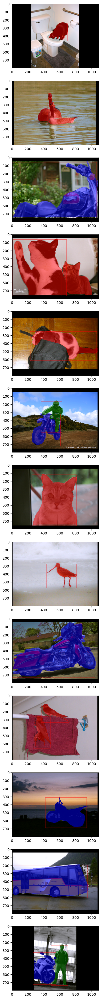

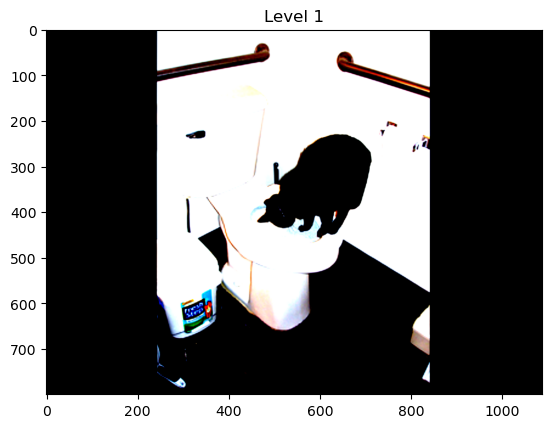

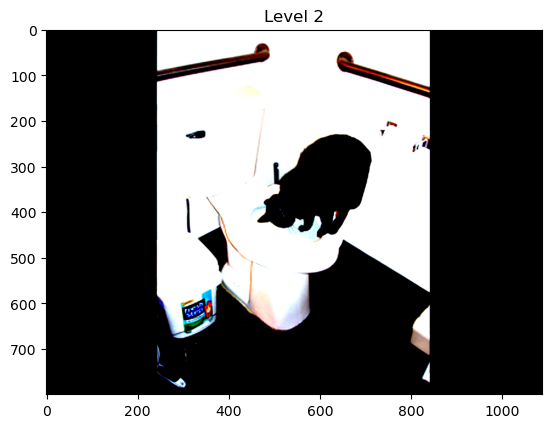

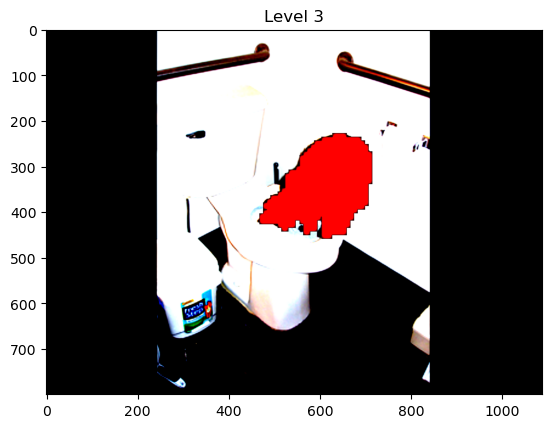

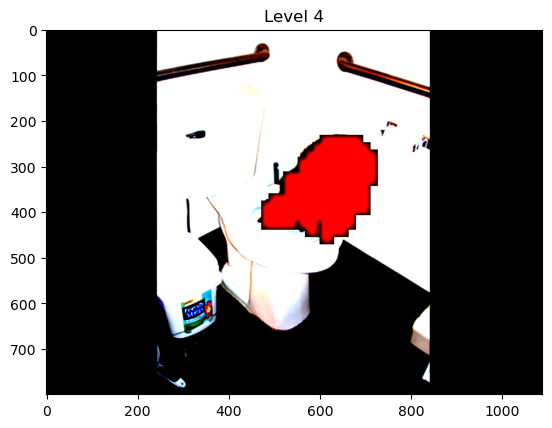

...

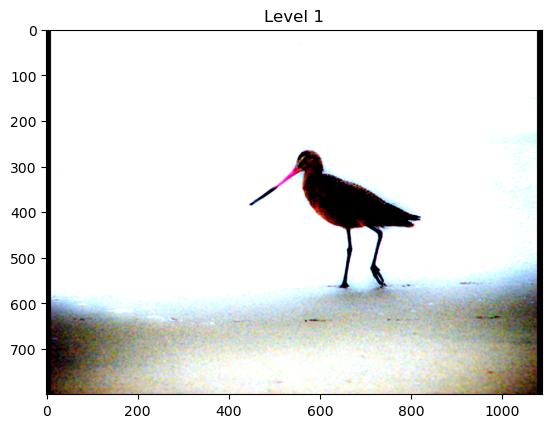

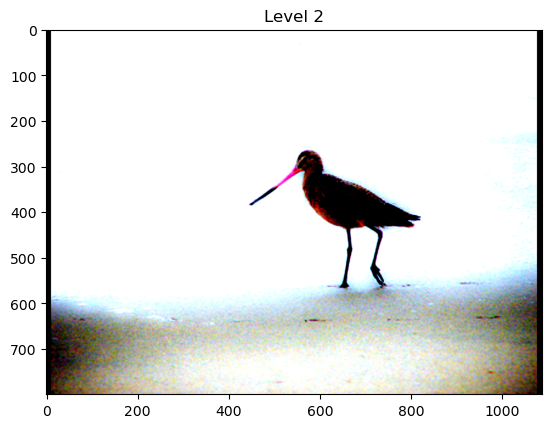

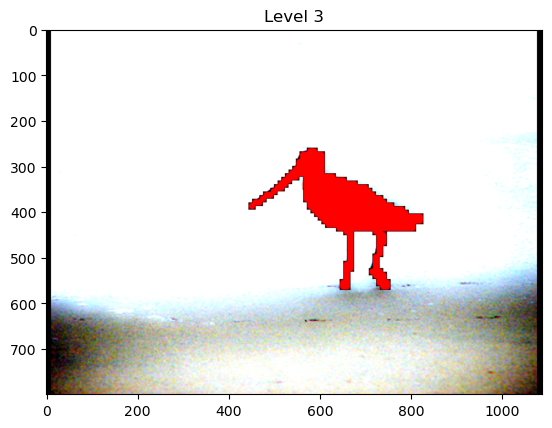

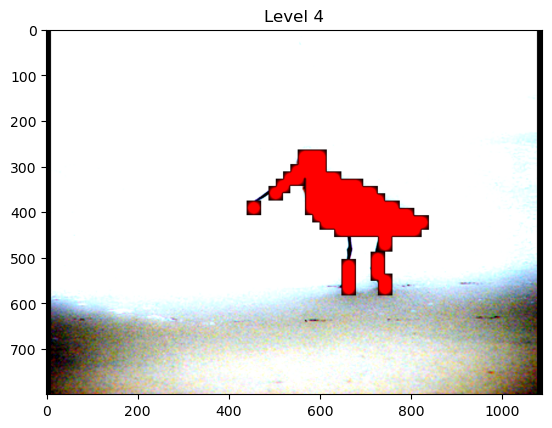

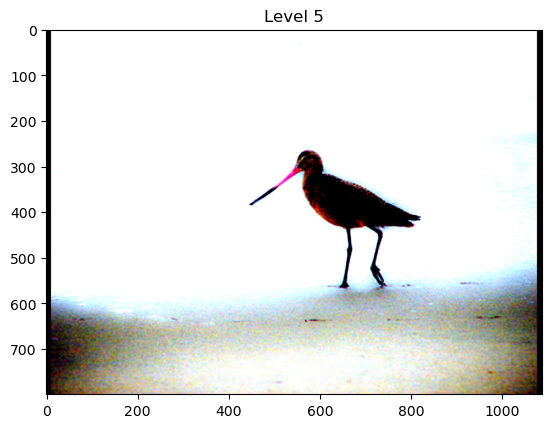

In [91]:
result_only()

In [70]:
import pytorch_lightning as pl

class SOLO(pl.LightningModule):
    _default_cfg = {
        'num_classes': 4,
        'in_channels': 256,
        'seg_feat_channels': 256,
        'stacked_convs': 7,
        'strides': [8, 8, 16, 32, 32],
        'scale_ranges': [(1, 96), (48, 192), (96, 384), (192, 768), (384, 2048)],
        'epsilon': 0.2,
        'num_grids': [40, 36, 24, 16, 12],
        'mask_loss_cfg': dict(weight=3),
        'cate_loss_cfg': dict(gamma=2, alpha=0.25, weight=1),
        'postprocess_cfg': dict(cate_thresh=0.2, mask_thresh=0.5, pre_NMS_num=50, keep_instance=5, IoU_thresh=0.5)
    }

    def __init__(self, **kwargs):
        super().__init__()
        for k, v in {**self._default_cfg, **kwargs}.items():
            setattr(self, k, v)

        pretrained_model = torchvision.models.detection.maskrcnn_resnet50_fpn(pretrained=False, pretrained_backbone=True)
        self.backbone = pretrained_model.backbone

        self.training_step_outputs = []
        self.e_average=[]

        self.train_loss = []
        self.mask_loss = []
        self.category_loss = []

        self.train_loss1 = []
        self.mask_loss1 = []
        self.category_loss1 = []

        self.val_loss = []
        self.mask_loss_val = []
        self.category_loss_val = []

        self.val_loss1 = []
        self.val_mask_loss1 = []
        self.val_category_loss1 = []

        #return {"loss":train_loss, "msk_loss":msk_loss, "cat_loss":cat_loss}

        self.train_loss_epoch = []
        self.train_category_loss_epoch = []
        self.train_mask_loss_epoch = []

        self.val_loss_epoch = []
        self.val_category_loss_epoch = []
        self.val_mask_loss_epoch = []

        self.conv1 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn1   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu1 = nn.ReLU()

        self.conv2 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn2   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu2 = nn.ReLU()

        self.conv3 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn3   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu3 = nn.ReLU()

        self.conv4 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn4   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu4 = nn.ReLU()

        self.conv5 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn5   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu5 = nn.ReLU()

        self.conv6 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn6   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu6 = nn.ReLU()

        self.conv7 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn7   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu7 = nn.ReLU()

        self.conv_out0 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['num_classes']-1, kernel_size=3, stride=1, padding=1, bias=True)
        self.sig0 = nn.Sigmoid()

        
        self.conv8 = nn.Conv2d(in_channels=self._default_cfg['in_channels']+2, out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn8   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu8 = nn.ReLU()

        self.conv9 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn9   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu9 = nn.ReLU()

        self.conv10 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn10   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu10 = nn.ReLU()

        self.conv11 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn11   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu11 = nn.ReLU()

        self.conv12 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn12   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu12 = nn.ReLU()

        self.conv13 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn13   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu13 = nn.ReLU()

        self.conv14 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['in_channels'], kernel_size=3, stride=1, padding=1, bias=False)
        self.grn14   = nn.GroupNorm(num_groups = 32, num_channels= 256)
        self.relu14 = nn.ReLU()

        self.conv_out1 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['num_grids'][0]**2, kernel_size=1, stride=1, padding=0, bias=True)
        self.sig1 = nn.Sigmoid()
        
        self.conv_out2 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['num_grids'][1]**2, kernel_size=1, stride=1, padding=0, bias=True)
        self.sig2 = nn.Sigmoid()
        
        self.conv_out3 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['num_grids'][2]**2, kernel_size=1, stride=1, padding=0, bias=True)
        self.sig3 = nn.Sigmoid()
        
        self.conv_out4 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['num_grids'][3]**2, kernel_size=1, stride=1, padding=0, bias=True)
        self.sig4 = nn.Sigmoid()
        
        self.conv_out5 = nn.Conv2d(in_channels=self._default_cfg['in_channels'], out_channels=self._default_cfg['num_grids'][4]**2, kernel_size=1, stride=1, padding=0, bias=True)
        self.sig5 = nn.Sigmoid()

    # Forward function should calculate across each level of the feature pyramid network.
    # Input:
    #     images: batch_size number of images
    # Output:
    #     if eval = False
    #         category_predictions: list, len(fpn_levels), each (batch_size, C-1, S, S)
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, 2*feature_h, 2*feature_w)
    #     if eval==True
    #         category_predictions: list, len(fpn_levels), each (batch_size, S, S, C-1)
    #         / after point_NMS
    #         mask_predictions:     list, len(fpn_levels), each (batch_size, S^2, image_h/4, image_w/4)
    #         / after upsampling
    def forward(self, images, eval=True):
        # you can modify this if you want to train the backbone
        feature_pyramid = [v.detach() for v in self.backbone(images).values()] # this has strides [4,8,16,32,64]
        category_final_predict = []
        mask_final_predict = []
        for i in range(len(feature_pyramid)):
          h = int(800 / self._default_cfg["strides"][i])
          w = int(1088/ self._default_cfg["strides"][i])
          image_h = int(800 / 4)
          image_w = int(1088 / 4)
          
          if eval == True :
            stacked_categs = torch.zeros((batch_size, self._default_cfg["num_grids"][i], self._default_cfg["num_grids"][i], self._default_cfg["num_classes"]-1))
            stacked_masks = torch.zeros((batch_size, self._default_cfg["num_grids"][i]**2, image_h, image_w))       
          else : 
            stacked_categs = torch.zeros((batch_size, self._default_cfg["num_classes"]-1, self._default_cfg["num_grids"][i], self._default_cfg["num_grids"][i]))
            stacked_masks = torch.zeros((batch_size, self._default_cfg["num_grids"][i]**2, 2*h, 2*w))

          for num in range(0, len(images)):
            net_input = feature_pyramid[i][num].to(device)
            if i == 0 or (len(feature_pyramid) - 1):
              net_input = F.interpolate(feature_pyramid[i][num].unsqueeze(0), size=(2*h, 2*w), mode='bilinear').to(device)

            category_net_input = F.interpolate(net_input, size=(self._default_cfg['num_grids'][i] , self._default_cfg['num_grids'][i] ) , mode = 'bilinear').to(device)
            x = self.relu1(self.grn1(self.conv1(category_net_input)))
            x = self.relu2(self.grn2(self.conv2(x)))
            x = self.relu3(self.grn3(self.conv3(x)))
            x = self.relu4(self.grn4(self.conv4(x)))
            x = self.relu5(self.grn5(self.conv5(x)))
            x = self.relu6(self.grn6(self.conv6(x)))
            x = self.relu7(self.grn7(self.conv7(x)))
            category_net_output = self.sig0(self.conv_out0(x))
            mask_net_input = net_input.clone().to(device)
            x_ch, y_ch = torch.meshgrid(torch.arange(mask_net_input.shape[2], device=device), torch.arange(mask_net_input.shape[3], device=device))
            x_ch = x_ch.to(device)
            y_ch = y_ch.to(device)
            x_ch_norm = (((x_ch - torch.min(x_ch))/torch.max(x_ch - torch.min(x_ch))) - 0.5)/0.5 
            y_ch_norm = (((y_ch - torch.min(y_ch))/torch.max(y_ch - torch.min(y_ch))) - 0.5)/0.5 

            mask_net_input = torch.cat((torch.tensor(mask_net_input.squeeze(0)), torch.tensor(x_ch_norm.unsqueeze(0)), torch.tensor(y_ch_norm.unsqueeze(0))), dim=0)
            y = self.relu8(self.grn8(self.conv8(mask_net_input).unsqueeze(0)))
            y = self.relu9(self.grn9(self.conv9(y)))
            y = self.relu10(self.grn10(self.conv10(y)))
            y = self.relu11(self.grn11(self.conv11(y)))
            y = self.relu12(self.grn12(self.conv12(y)))
            y = self.relu13(self.grn13(self.conv13(y)))
            y = self.relu14(self.grn14(self.conv14(y)))
            if i == 0 :
              mask_net_output = self.sig1(self.conv_out1(y))
            elif i == 1 :
              mask_net_output = self.sig2(self.conv_out2(y))
            elif i == 2 :
              mask_net_output = self.sig3(self.conv_out3(y))
            elif i == 3 : 
              mask_net_output = self.sig4(self.conv_out4(y))
            elif i == 4:
              mask_net_output = self.sig5(self.conv_out5(y))
            
            if eval == True : 
              cat_net_op_eval = category_net_output.permute(0,2,3,1)
              stacked_categs[num] = cat_net_op_eval
              mask_net_op_eval = F.interpolate(mask_net_output, size=(image_h, image_w), mode='bilinear')
              stacked_masks[num] = mask_net_op_eval
            else : 
              stacked_masks[num] = mask_net_output
              stacked_categs[num] = category_net_output

          category_final_predict.append(stacked_categs)
          mask_final_predict.append(stacked_masks.to(device))

        return category_final_predict, mask_final_predict
    
    def loss(self, category_predict, mask_predict, category_target, mask_target, active_mask):
        category_target_flattened = torch.cat([torch.cat([level.flatten() for level in image]) for image in category_target]).type(torch.long)   
        onehot_category_target_flattened = F.one_hot(category_target_flattened, num_classes=4)[:,1:].clone().flatten().to(device)                                                                   
        category_predict_flattened = torch.cat([channel.permute(0,2,3,1).reshape(-1,3) for channel in category_predict])                                   
        index = torch.where(onehot_category_target_flattened!=0)[0]
        alpha = torch.ones_like(onehot_category_target_flattened) * self._default_cfg["cate_loss_cfg"]["alpha"]
        alpha[index] = 1 - self._default_cfg["cate_loss_cfg"]["alpha"]
        new_cat = category_predict_flattened.clone().flatten().to(device)
        new_cat[index] = 1 - new_cat[index]
        focal_loss = torch.sum(-alpha * torch.pow(1 - new_cat, self._default_cfg["cate_loss_cfg"]["gamma"]) * torch.log(new_cat + 0.00000001)) / (3*category_target_flattened.shape[0])
        category_loss = self._default_cfg["cate_loss_cfg"]['weight'] * focal_loss
        
        N = 0
        mask_total_loss = 0
        image_loss = []
        for i in range(len(mask_target)):                  
          level_loss = []
          single_loss = 0
          for level in range(5):
            active_level = active_mask[i][level]               
            N += torch.sum(active_level)
            index = torch.where(active_level!=0)[0].to(device)
            if len(index) == 0:
              continue
            active_mask_target_level = mask_target[i][level][index]      
            active_mask_predict_level = mask_predict[level][i][index]
            for j in range(active_mask_predict_level.shape[0]):
              p = active_mask_target_level[j].to(device)
              q = active_mask_predict_level[j].to(device)
              dice = 1 - torch.sum(2*p * q) / (torch.sum(torch.pow(p, 2)) + torch.sum(torch.pow(q, 2) + 0.000001))
              
              single_loss += dice
              
            level_loss.append(single_loss)
          image_loss.append(sum(level_loss)/5)
        mask_total_loss = sum(image_loss)/len(image_loss)
        mask_loss = self._default_cfg["mask_loss_cfg"]['weight']*(mask_total_loss/N)
        final_loss = category_loss + mask_loss
        return final_loss, mask_loss, category_loss
    

    def training_step(self, batch, batch_index):
      images, labels, masks, bounding_boxes = batch
      category_predict, mask_predict = self.forward(images, eval=False)
      category_targets, mask_targets, active_masks = self.generate_targets(bounding_boxes, labels, masks)
      self.train_loss, self.mask_loss, self.category_loss = self.loss(category_predict, mask_predict, category_targets, mask_targets, active_masks)

      self.training_step_outputs.append(self.train_loss)

      self.train_loss1.append(self.train_loss)
      self.mask_loss1.append(self.mask_loss)
      self.category_loss1.append(self.category_loss)
      del images, labels, masks, bounding_boxes
      del mask_targets, category_targets, active_masks
      torch.cuda.empty_cache()

      self.log("train_loss", self.train_loss, prog_bar=True, on_epoch=True)
      self.log("mask_loss", self.mask_loss, prog_bar=True)
      self.log("category loss", self.category_loss, prog_bar=True)

      return {"loss":self.train_loss, "msk_loss":self.mask_loss, "cat_loss":self.category_loss}

    def on_train_epoch_end(self):
      average_train_loss = 0
      average_category_loss = 0
      average_mask_loss = 0 
      for i in range(len(self.train_loss1)):
        average_train_loss += self.train_loss1[i].detach().cpu().item()
        average_category_loss += self.category_loss1[i].detach().cpu().item()
        average_mask_loss += self.mask_loss1[i].detach().cpu().item()
      
      epoch_average = torch.stack(self.training_step_outputs).mean()
      self.e_average.append(epoch_average)
      self.log("training_epoch_average", epoch_average)
      self.training_step_outputs.clear()
      average_train_loss = average_train_loss/len(self.train_loss1)
      average_category_loss = average_category_loss/len(self.category_loss1)
      average_mask_loss = average_mask_loss/len(self.mask_loss1)
      self.train_loss1.clear()
      self.mask_loss1.clear()
      self.category_loss1.clear()
      
      
      self.train_loss_epoch.append(average_train_loss)
      self.train_category_loss_epoch.append(average_category_loss)
      self.train_mask_loss_epoch.append(average_mask_loss)


    def validation_step(self, batch, batch_index):
      images, labels, masks, bounding_boxes = batch
      category_predict, mask_predict = self.forward(images, eval=False)
      category_targets, mask_targets, active_masks = self.generate_targets(bounding_boxes, labels, masks)
      self.val_loss, self.mask_loss_val, self.category_loss_val = self.loss(category_predict, mask_predict, category_targets, mask_targets, active_masks)

      self.val_loss1.append(self.val_loss)
      self.val_mask_loss1.append(self.mask_loss_val)
      self.val_category_loss1.append(self.category_loss_val)


      del images, labels, masks, bounding_boxes
      del mask_targets, category_targets, active_masks
      torch.cuda.empty_cache()

      self.log("val_loss", self.val_loss)
      return {"loss":self.val_loss, "msk_loss":self.mask_loss_val, "cat_loss":self.category_loss_val}

    def on_validation_epoch_end(self):
      average_train_loss = 0
      average_category_loss = 0
      average_mask_loss = 0
      for i in range(len(self.val_loss1)):
        average_train_loss += self.val_loss1[i].detach().cpu().item()
        average_category_loss += self.val_category_loss1[i].detach().cpu().item()
        average_mask_loss += self.val_mask_loss1[i].detach().cpu().item()
      
      average_train_loss = average_train_loss/len(self.val_loss1)
      average_category_loss = average_category_loss/len(self.val_category_loss1)
      average_mask_loss = average_mask_loss/len(self.val_mask_loss1)

      self.val_loss1.clear()
      self.val_mask_loss1.clear()
      self.val_category_loss1.clear()
      
      self.val_loss_epoch.append(average_train_loss)
      self.val_category_loss_epoch.append(average_category_loss)
      self.val_mask_loss_epoch.append(average_mask_loss)


    def configure_optimizers(self):
      opt = torch.optim.SGD(model.parameters(), lr=0.01, momentum=0.9, weight_decay=0.0001)
      #scheduler = MultiStepLR(optimizer, milestones=[27,33], gamma=0.1)

      return opt
    
    def points_nms(heat, kernel=2):
      # kernel must be 2
      hmax = F.max_pool2d(
          heat, (kernel, kernel), stride=1, padding=1)
      keep = (hmax[:, :, :-1, :-1] == heat).float()
      return heat * keep




    # This function build the ground truth tensor for each batch in the training
    # Input:
    #     bounding_boxes:   list, len(batch_size), each (n_object, 4) (x1 y1 x2 y2 system)
    #     labels:           list, len(batch_size), each (n_object, )
    #     masks:            list, len(batch_size), each (n_object, 800, 1088)
    # Output:
    #     category_targets: list, len(batch_size), list, len(fpn), (S, S), values are {1, 2, 3}
    #     mask_targets:     list, len(batch_size), list, len(fpn), (S^2, 2*feature_h, 2*feature_w)
    #     active_masks:     list, len(batch_size), list, len(fpn), (S^2,)
    #     / boolean array with positive mask predictions
    def generate_targets(self, bounding_boxes, labels, masks):
      category_targets = []
      mask_targets = []
      active_masks = []
      for bbox, lab, mask in zip(bounding_boxes, labels, masks):
        x_centre_scaled = torch.zeros(5, lab.shape[0])
        y_centre_scaled = torch.zeros(5, lab.shape[0])
        width_and_height = torch.zeros((bbox.shape[0],2))
        width_and_height[:,0] = bbox[:,2] - bbox[:,0]
        width_and_height[:,1] = bbox[:,3] - bbox[:,1]
        area = torch.sqrt(width_and_height[:,0] * width_and_height[:,1])
        width_scaled = torch.zeros(5, lab.shape[0])
        height_scaled = torch.zeros(5, lab.shape[0])
        x_centre = (bbox[:,2] + bbox[:,0]) / 2
        y_centre = (bbox[:,3] + bbox[:,1]) / 2

        for i in range(5):
          x_centre_scaled[i] = x_centre * (_default_cfg["num_grids"][i] / 1088)
        for i in range(5):
          y_centre_scaled[i] = y_centre * (_default_cfg["num_grids"][i] / 800)
        for i in range(5):
          width_scaled[i] = width_and_height[:,0] * (_default_cfg["num_grids"][i] / 1088)
        for i in range(5):
          height_scaled[i] = width_and_height[:,1] * (_default_cfg["num_grids"][i] / 800)

        levels = [torch.logical_and(_default_cfg["scale_ranges"][i][0] < area, area < _default_cfg["scale_ranges"][i][1]).int() for i in range(5)]

        image_category_fpn = []
        image_mask_fpn = []
        image_active_fpn = []
        category_fpn = [torch.zeros(_default_cfg["num_grids"][i], _default_cfg["num_grids"][i]).to(device) for i in range(5)]
        mask_fpn = [torch.zeros((_default_cfg["num_grids"][i]**2, int(2 * 800 / _default_cfg["strides"][i]), int(2 * 1088 / _default_cfg["strides"][i]))).to(device) for i in range(5)]
        active_fpn = [torch.zeros(_default_cfg["num_grids"][i]**2).to(device) for i in range(5)]

        for i, level in enumerate(levels):
          level = level.view(lab.shape[0], 1)
          H_f = int(800 / _default_cfg["strides"][i])
          W_f = int(1088/ _default_cfg["strides"][i])
          scaled_mask = F.interpolate(mask.unsqueeze(0), size=(2*H_f, 2*W_f), mode='nearest').squeeze(0).to(device)
          for j, label in enumerate(level):
            if label.item() == 0:
              continue
            else:
              x_top = torch.round(x_centre_scaled[i, j] - (0.2 * width_scaled[i, j] / 2))
              x_top = (max(x_top, x_centre_scaled[i, j] - 1)).int().item()
              x_down = torch.round(x_centre_scaled[i, j] + (0.2 * width_scaled[i, j] / 2))
              x_down = (min(x_down, x_centre_scaled[i, j] + 1)).int().item()
              y_top  = torch.round(y_centre_scaled[i, j] - (0.2 * height_scaled[i, j] / 2))
              y_top = (max(y_top, y_centre_scaled[i, j] - 1)).int().item()
              y_down = torch.round(y_centre_scaled[i, j] + (0.2 * height_scaled[i, j] / 2))
              y_down = (min(y_down, y_centre_scaled[i, j] + 1)).int().item()
              xx, yy = torch.meshgrid(torch.arange(y_top, y_down+1, device=device), torch.arange(x_top, x_down+1, device=device))
              xx = xx.to(device)
              yy = yy.to(device)
              category_fpn[i][xx, yy] = lab[j].item()
              mask_fpn[i][xx.flatten()*_default_cfg["num_grids"][i] + yy.flatten()] = scaled_mask[j]
              active_fpn[i][xx.flatten()*_default_cfg["num_grids"][i] + yy.flatten()] = 1.
          image_mask_fpn.append(mask_fpn[i])
          image_category_fpn.append(category_fpn[i])
          image_active_fpn.append(active_fpn[i])
        category_targets.append(image_category_fpn)
        mask_targets.append(image_mask_fpn)
        active_masks.append(image_active_fpn)

      return category_targets, mask_targets, active_masks


    

def post_process(category_levels, masks):
  flattened_categories = torch.cat([level.view(-1, level.size(-1)) for level in category_levels], dim=0)
  flattened_masks = torch.cat(masks, dim=0)
  category_max, category_max_index = torch.max(flattened_categories, dim=1)
  above_threshold_max = category_max[torch.where(category_max > _default_cfg["postprocess_cfg"]["cate_thresh"])[0]]
  above_threshold_max_index = category_max_index[torch.where(category_max > _default_cfg["postprocess_cfg"]["cate_thresh"])[0]]
  above_threshold_masks = flattened_masks[torch.where(category_max > _default_cfg["postprocess_cfg"]["cate_thresh"])[0]]
  score = torch.stack([torch.mean(mask[torch.where(mask > _default_cfg["postprocess_cfg"]["mask_thresh"])]* above_thresh_max_each) for mask, above_thresh_max_each in zip(above_threshold_masks.float(), above_threshold_max.float())])
  score = torch.nan_to_num(score, nan=0.)
  score_sorted, indices_sorted = torch.sort(score, descending=True)
  mask_sorted = above_threshold_masks[indices_sorted]
  class_sorted = above_threshold_max_index[indices_sorted]
  nms_score = MatrixNMS(mask_sorted, score_sorted)
  sorted_nms_scores, nms_indices_sorted = torch.sort(nms_score, descending=True)
  final_masks_sorted = mask_sorted[nms_indices_sorted]
  top_two_masks = final_masks_sorted[:2]
  final_classes_sorted = class_sorted[nms_indices_sorted]
  final_classes = final_classes_sorted[:2]
  final_masks = F.interpolate(top_two_masks.unsqueeze(0), size=(800, 1088), mode="bilinear")

  return final_masks, final_classes

def points_nms(heat, kernel=2):
    # kernel must be 2
    hmax = F.max_pool2d(
        heat, (kernel, kernel), stride=1, padding=1)
    keep = (hmax[:, :, :-1, :-1] == heat).float()
    return heat * keep

# This function performs Matrix NMS
# Input:
#     sorted_masks: (n_active, image_h/4, image_w/4)
#     sorted_scores: (n_active,)
# Output:
#     decay_scores: (n_active,)
def MatrixNMS(sorted_masks, sorted_scores, method='gauss', gauss_sigma=0.5):
    n = len(sorted_scores)
    sorted_masks = sorted_masks.reshape(n, -1)
    intersection = torch.mm(sorted_masks, sorted_masks.T)
    areas = sorted_masks.sum(dim=1).expand(n, n)
    union = areas + areas.T - intersection
    ious = (intersection / union).triu(diagonal=1)

    ious_cmax = ious.max(0)[0].expand(n, n).T
    if method == 'gauss':
        decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
    else:
        decay = (1 - ious) / (1 - ious_cmax)
    decay = decay.min(dim=0)[0]
    return sorted_scores * decay


In [72]:
model = SOLO()

epochs = 60

logger = pl_loggers.TensorBoardLogger("tb_logs", name="SOLO")
# trainer = pl.Trainer(accelerator='cpu', devices=1, max_epochs=epochs, logger=logger)
trainer = pl.Trainer(accelerator='cpu', devices=1, max_epochs=epochs, logger=logger)
trainer.fit(model, trainloader, testloader)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

   | Name      | Type            | Params
-----------------------------------------------
0  | backbone  | BackboneWithFPN | 26.8 M
1  | conv1     | Conv2d          | 589 K 
2  | grn1      | GroupNorm       | 512   
3  | relu1     | ReLU            | 0     
4  | conv2     | Conv2d          | 589 K 
5  | grn2      | GroupNorm       | 512   
6  | relu2     | ReLU            | 0     
7  | conv3     | Conv2d          | 589 K 
8  | grn3      | GroupNorm       | 512   
9  | relu3     | ReLU            | 0     
10 | conv4     | Conv2d          | 589 K 
11 | grn4      | GroupNorm       | 512   
12 | relu4     | ReLU            | 0     
13 | conv5     | Conv2d          | 589 K 
14 | grn5      | GroupNorm       | 512   
15 | relu5     | ReLU            | 0     
16 | conv6     | Conv2d          | 589 K 
17 | grn6      | GroupNorm       | 512   


Epoch 59: 100%|██████████| 4/4 [01:57<00:00, 29.45s/it, v_num=64, train_loss_step=0.0382, mask_loss=0.0371, category loss=0.00107, train_loss_epoch=0.059] 

`Trainer.fit` stopped: `max_epochs=60` reached.


Epoch 59: 100%|██████████| 4/4 [01:58<00:00, 29.55s/it, v_num=64, train_loss_step=0.0382, mask_loss=0.0371, category loss=0.00107, train_loss_epoch=0.059]


[tensor(0.2381, grad_fn=<MeanBackward0>), tensor(0.2210, grad_fn=<MeanBackward0>), tensor(0.2164, grad_fn=<MeanBackward0>), tensor(0.2123, grad_fn=<MeanBackward0>), tensor(0.2078, grad_fn=<MeanBackward0>), tensor(0.2031, grad_fn=<MeanBackward0>), tensor(0.1986, grad_fn=<MeanBackward0>), tensor(0.1942, grad_fn=<MeanBackward0>), tensor(0.1897, grad_fn=<MeanBackward0>), tensor(0.1854, grad_fn=<MeanBackward0>), tensor(0.1812, grad_fn=<MeanBackward0>), tensor(0.1771, grad_fn=<MeanBackward0>), tensor(0.1733, grad_fn=<MeanBackward0>), tensor(0.1696, grad_fn=<MeanBackward0>), tensor(0.1659, grad_fn=<MeanBackward0>), tensor(0.1622, grad_fn=<MeanBackward0>), tensor(0.1585, grad_fn=<MeanBackward0>), tensor(0.1547, grad_fn=<MeanBackward0>), tensor(0.1510, grad_fn=<MeanBackward0>), tensor(0.1473, grad_fn=<MeanBackward0>), tensor(0.1435, grad_fn=<MeanBackward0>), tensor(0.1399, grad_fn=<MeanBackward0>), tensor(0.1362, grad_fn=<MeanBackward0>), tensor(0.1326, grad_fn=<MeanBackward0>), tensor(0.1290, 

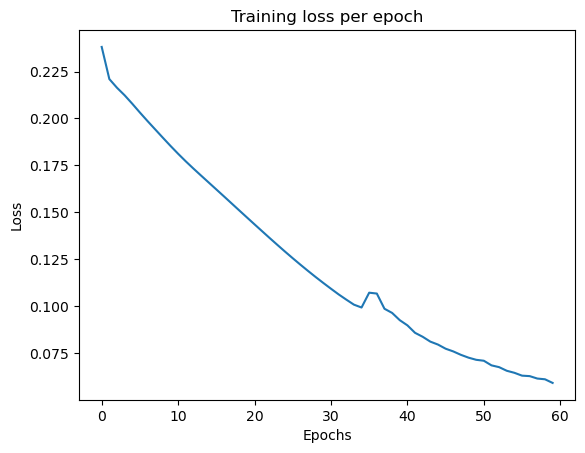

In [73]:
tot_train_losses = model.train_loss_epoch
print(model.e_average)
print(tot_train_losses)
print(len(tot_train_losses))
plt.plot(tot_train_losses)
plt.title("Training loss per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

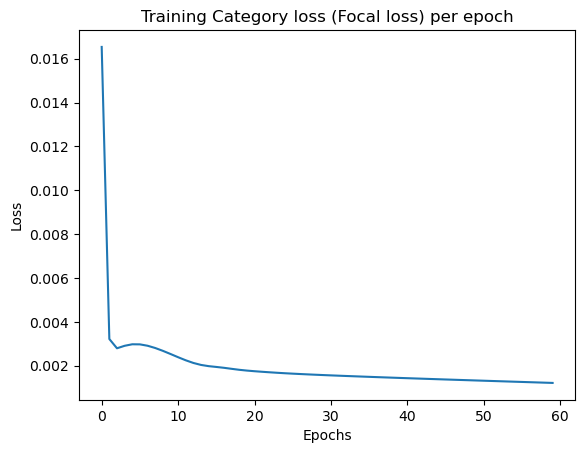

In [83]:
tot_cat_train_losses = model.train_category_loss_epoch
plt.plot(tot_cat_train_losses)
plt.title("Training Category loss (Focal loss) per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

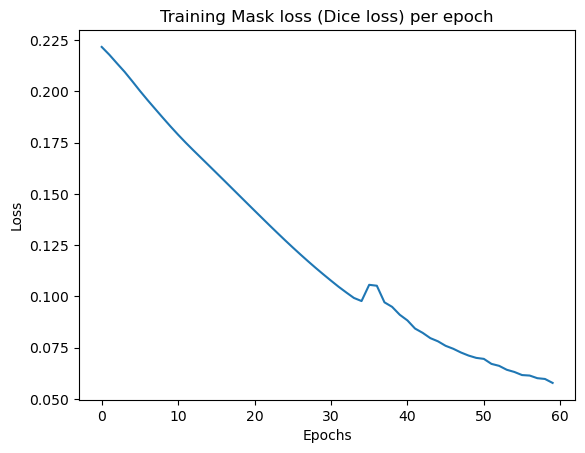

In [84]:
tot_msk_train_losses = model.train_mask_loss_epoch
plt.plot(tot_msk_train_losses)
plt.title("Training Mask loss (Dice loss) per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

[0.2403782159090042, 0.21885749995708464, 0.21495708525180818, 0.21258313357830047, 0.2101638376712799, 0.2077069491147995, 0.20546927750110627, 0.20338319838047028, 0.2014043003320694, 0.19964934885501862, 0.19829431176185608, 0.19698576033115386, 0.19570137858390807, 0.19472070634365082, 0.19382184743881226, 0.19288645386695863, 0.1921718180179596, 0.1912994086742401, 0.19056393802165986, 0.18995735943317413, 0.18925466537475585, 0.18868533074855803, 0.18786675333976746, 0.18725876808166503, 0.18646619319915772, 0.185859552025795, 0.1852283626794815, 0.18459008038043975, 0.18407416939735413, 0.18367556631565093, 0.18320288956165315, 0.18251635730266572, 0.18161393702030182, 0.18105955719947814, 0.1837577074766159, 0.18742794990539552, 0.17640577405691146, 0.1943678081035614, 0.1758461445569992, 0.18516855239868163, 0.17660736441612243, 0.17775703072547913, 0.18002429008483886, 0.17573663592338562, 0.1806249052286148, 0.17580348253250122, 0.17973832190036773, 0.17592254281044006, 0.17

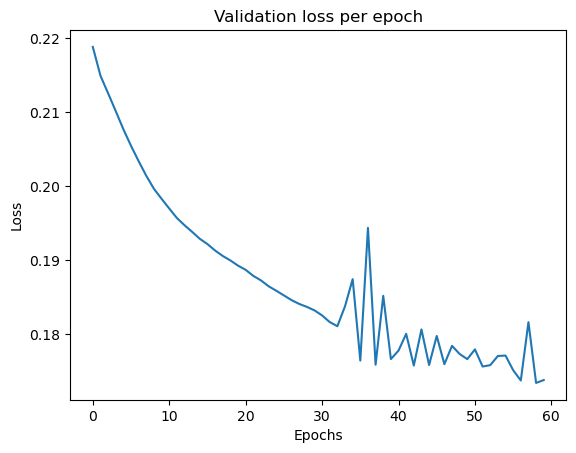

In [75]:
tot_cat_val_losses = model.val_loss_epoch
print(tot_cat_val_losses)   
plt.plot(tot_cat_val_losses[1:])
plt.title("Validation loss per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

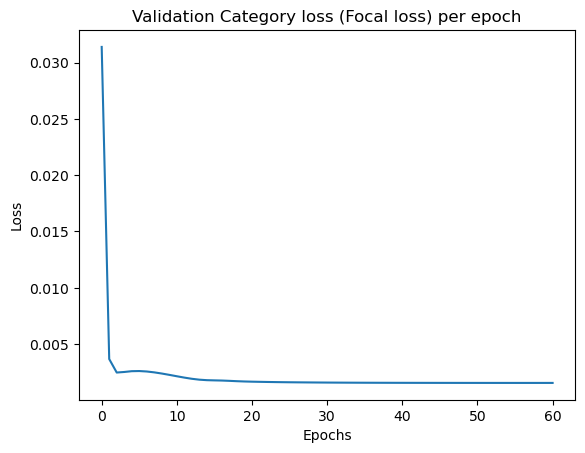

In [85]:
tot_cat_val_losses = model.val_category_loss_epoch
plt.plot(tot_cat_val_losses)
plt.title("Validation Category loss (Focal loss) per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

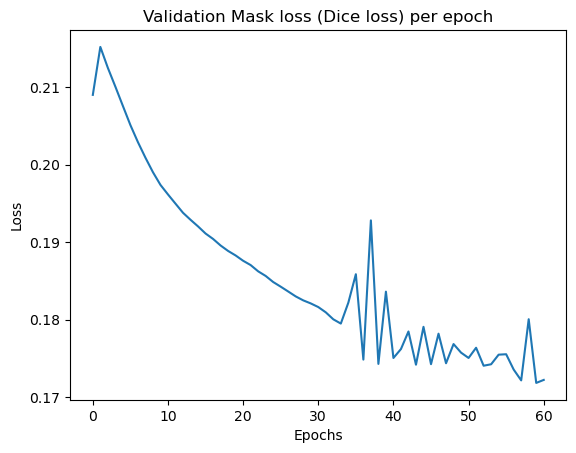

In [86]:
tot_msk_val_losses = model.val_mask_loss_epoch
plt.plot(tot_msk_val_losses)
plt.title("Validation Mask loss (Dice loss) per epoch")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

Run the cell below for the results of part b

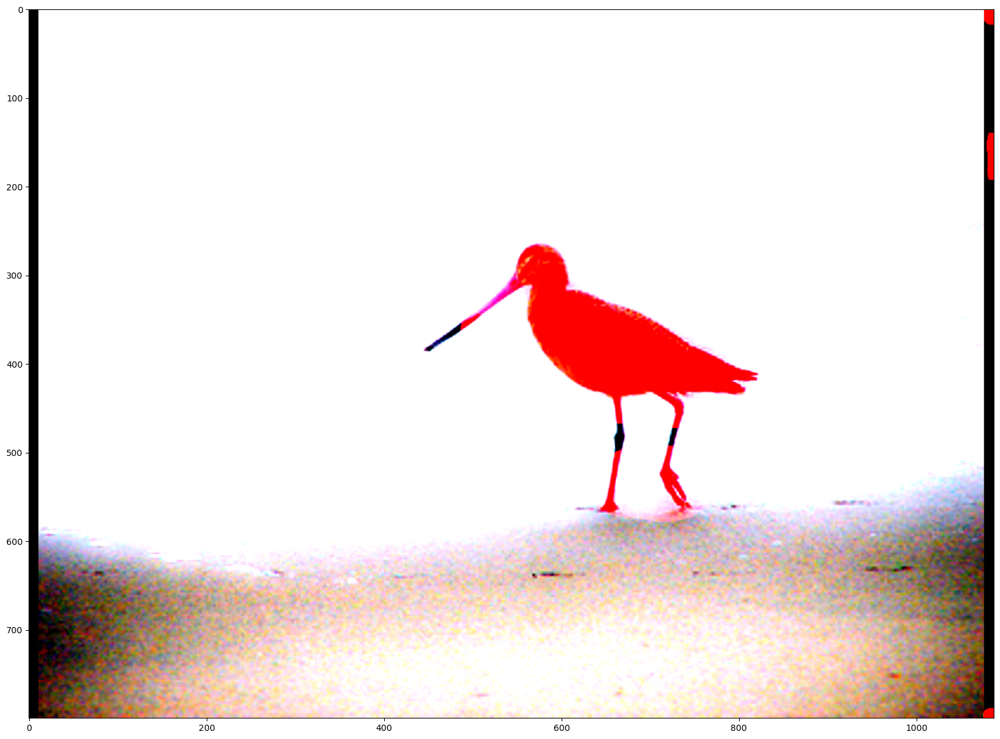

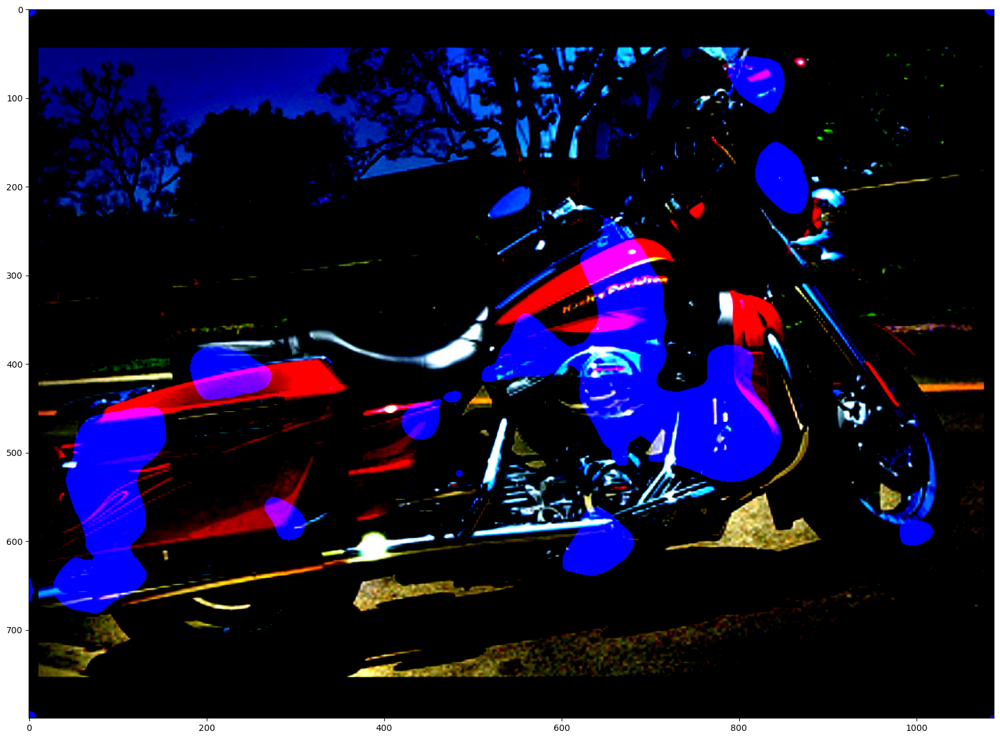

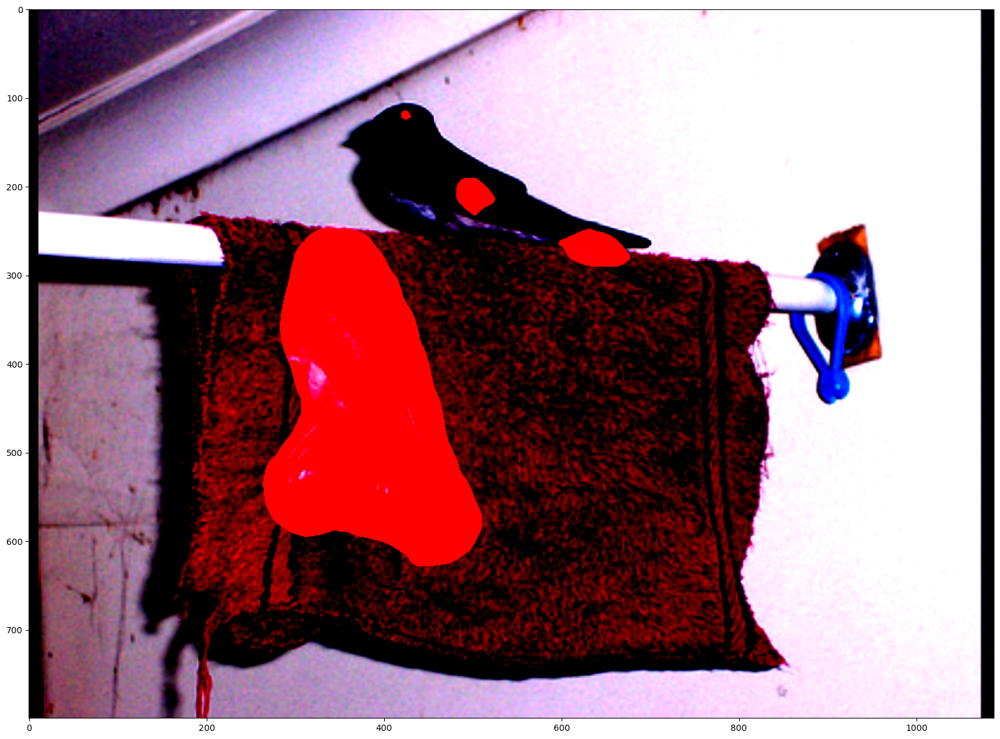

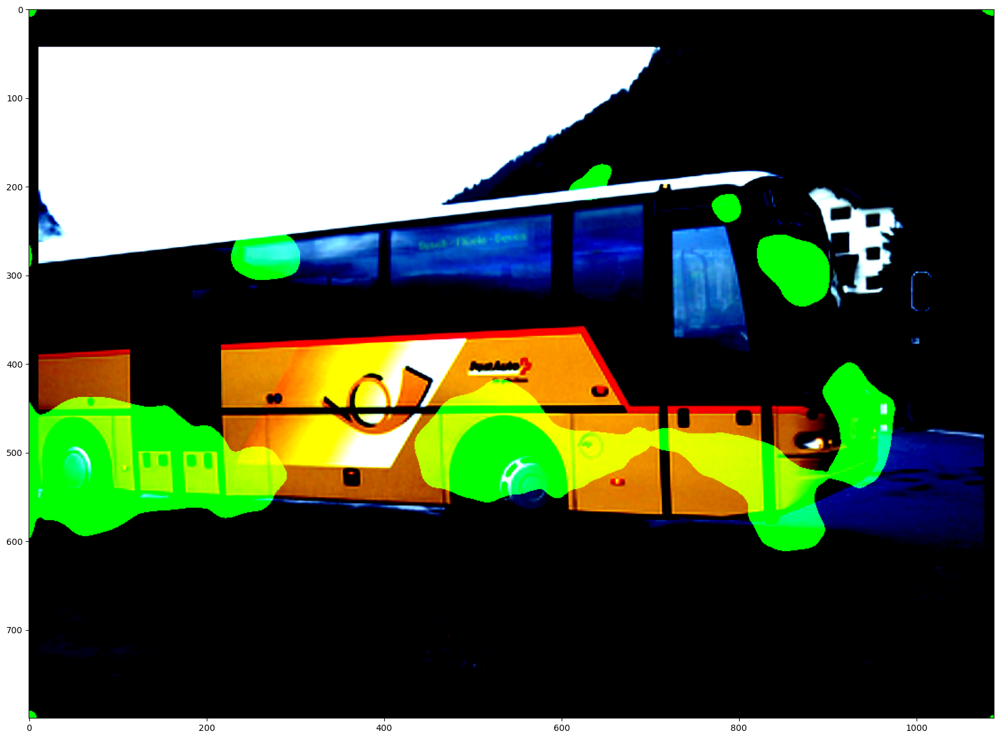

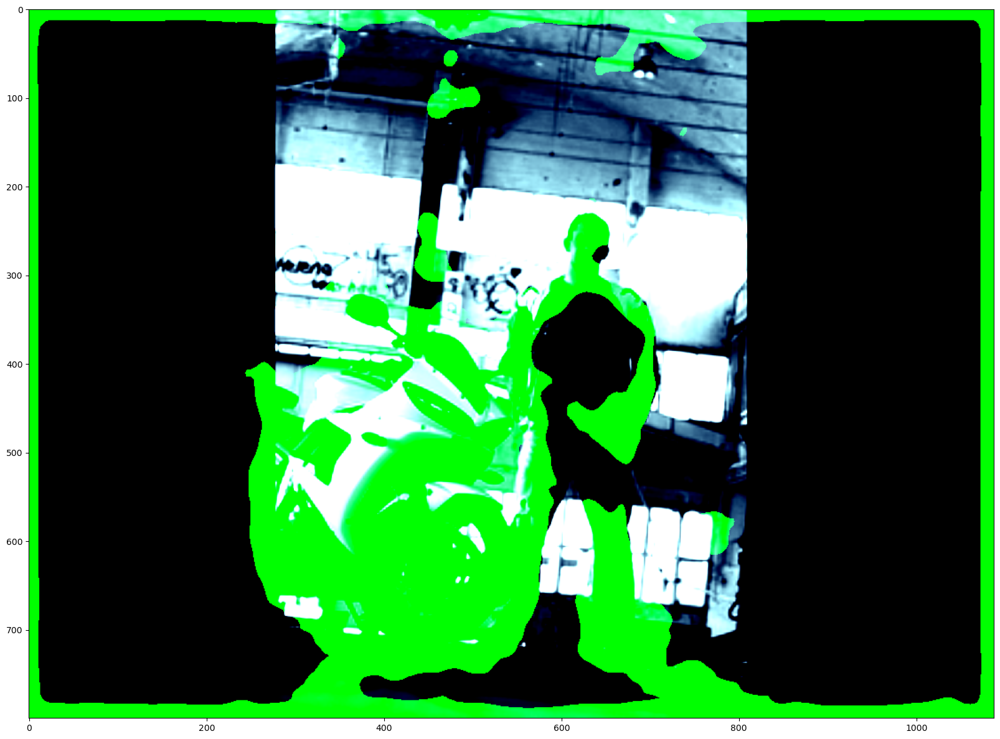

In [89]:
model.eval()
model.to(device)
count = 0
temp_flag = True
for i, batch_set in enumerate(testloader):

  image_set, label_set, mask_set, bbox_set = batch_set
  cat_pred, mask_predict = model.forward(image_set, eval=True)
  for i in range(batch_size):
    img_orig = image_set[i].squeeze(0)
    nms_input = [points_nms(cat_pred[j][i].unsqueeze(0).permute(0,3,1,2)).permute(0,2,3,1) for j in range(5)]
    cat_ip = [each_cat_level.squeeze(0) for each_cat_level in nms_input]
    mask_input = [mask_predict[j][i] for j in range(5)]
    masks, classes = post_process(cat_ip, mask_input)
    manipulated_mask = torch.where(masks>0.2, 1, 0)
    for x in range(len(manipulated_mask[0])):
      zero = np.where(manipulated_mask[0][x]==1, 0, 1)
      one = np.where(manipulated_mask[0][x]==1, 255., 0)
      image_new = img_orig.detach().cpu().numpy().copy()
      c = classes[x]
      image_new[c] = image_new[c]*zero + one*(1-0.2) + image_new[c]*0.2
      im = image_new.squeeze().transpose(1,2,0)
      im = np.clip(im, 0, 1)
    plt.figure(figsize = (20,20))
    plt.imshow(im)
    plt.show()
    count += 1
    if count == 5:
      temp_flag = False
      break
      
  if temp_flag == False:
    break  

In the analysis of the obtained results, it is evident that the model effectively accomplishes the classification task with satisfactory accuracy. However, there are notable discrepancies in the spatial alignment of the segmentation masks. The validation loss curves reveal a consistent decrease in the Dice Loss, albeit with discernible oscillations.

The oscillation observed in the validation Dice Loss suggests that the model encounters challenges in consistently achieving accurate spatial overlap between predicted and ground truth segmentation masks. Despite this, other loss curves exhibit favorable behavior.

A noteworthy observation pertains to scenarios involving multiple objects in an image. The model struggles to delineate distinct boundaries accurately. An exemplar case reveals an overlap between the region assigned to a person and an adjacent vehicle, where the model fails to segregate the two classes effectively.

It is crucial to acknowledge that the model's training was conducted with constraints on computing capacity. The training dataset consisted of a modest 400 images, and the model underwent training for 60 epochs. Despite these limitations, the model's performance is commendable. We anticipate that a substantial improvement in performance could be achieved with the utilization of a more extensive dataset and an increased number of training epochs. This optimization strategy could potentially enhance the model's ability to generalize and accurately segment diverse objects, particularly in scenarios involving multiple entities within an image.

### Part A Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. Should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.

We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so.

the method is :
##result_only()



Also, we have run the code locally because there was a RAM limit in Colab. So, if you run the notebook in colab, use these paths to access the dataset:
path["images"] = "/content/hw3_mycocodata_img_comp_zlib.h5"
path["labels"] = "/content/hw3_mycocodata_labels_comp_zlib.npy"
path["bboxes"] = "/content/hw3_mycocodata_bboxes_comp_zlib.npy"
path["masks"] = "/content/hw3_mycocodata_mask_comp_zlib.h5"

## Part B
### Loss
The loss function consists of two parts: category loss and mask loss:
$$L = \lambda_\text{cate} L_\text{cate} + \lambda_\text{mask} L_\text{mask} $$

The category loss is defined as (where $\text{FL}$ is the focal loss)

$$L_\text{cate} = \frac{1}{S^2 C} \sum_{S,S,C} \text{FL}(p_t)$$

$$\text{FL}(p_t) = -\alpha_t (1 - p_t)^\gamma \log{(p_t)}$$

$$(\alpha_t, p_t) = \left\{\begin{array}{lr} (\alpha, \hat{p}) & \text{if }y=1 \\ (1 - \alpha, 1 - \hat{p}) & \text{otherwise}\end{array}\right.$$

while the mask loss is defined as (where $d_\text{mask}$ is the dice loss)

$$L_\text{mask} = \frac{1}{N_\text{positive}} \sum_k \mathbb{1}_{\{p_{i, j} > 0\}} d_\text{mask}(m_k, \hat{m}_k)$$

$$d_\text{mask}(p, q) = 1 - D(p, q)$$

$$D(p, q) = \frac{2 \sum_{x,y}(p_{x,y} \cdot q_{x,y})}{\sum_{x,y}p_{x,y}^2 + \sum_{x,y}q_{x,y}^2}$$

### Post Processing
Post processing consists of three steps: points NMS, concatenation and sorting, and matrix NMS. A summary of each of these steps is provided below. In addition, your final mask prediction should be a binary mask based on the mask thresholding parameter. Some examples of results post-inference are shown in figs. 11-14.


<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig11.png" width=300/></div>
<center>Figure 11: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig12.png" width=300/></div>
<center>Figure 12: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig13.png" width=300/></div>
<center>Figure 13: SOLO instance segmentation example.</center>

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW3/fig14.png" width=300/></div>
<center>Figure 14: SOLO instance segmentation example.</center>

#### Points NMS
Non-max suppression for the category predictions, applied to each channel sperately. A maxpooling with a kernel size of 2, sample code is included below.

#### Concatenation and Sorting
Here, we merge the predictions across all the FPN levels into a single list of predictions, sorted by their predicted score. This involves rescaling the predicted masks appropriately.

#### Matrix NMS
Inspired by Soft-NMS, MatrixNMS suppresses mask predictions with a lower score based on their similarity to predictions with a higher score in a completely vectorized manner. Sample code is include below.

In [ ]:
# Credit to SOLO Author's code
# This function does NMS on the heat map (category_prediction), grid-level
# Input:
#     heat: (batch_size, C-1, S, S)
# Output:
#     (batch_size, C-1, S, S)
def points_nms(heat, kernel=2):
    # kernel must be 2
    hmax = F.max_pool2d(
        heat, (kernel, kernel), stride=1, padding=1)
    keep = (hmax[:, :, :-1, :-1] == heat).float()
    return heat * keep

# This function performs Matrix NMS
# Input:
#     sorted_masks: (n_active, image_h/4, image_w/4)
#     sorted_scores: (n_active,)
# Output:
#     decay_scores: (n_active,)
def MatrixNMS(sorted_masks, sorted_scores, method='gauss', gauss_sigma=0.5):
    n = len(sorted_scores)
    sorted_masks = sorted_masks.reshape(n, -1)
    intersection = torch.mm(sorted_masks, sorted_masks.T)
    areas = sorted_masks.sum(dim=1).expand(n, n)
    union = areas + areas.T - intersection
    ious = (intersection / union).triu(diagonal=1)

    ious_cmax = ious.max(0)[0].expand(n, n).T
    if method == 'gauss':
        decay = torch.exp(-(ious ** 2 - ious_cmax ** 2) / gauss_sigma)
    else:
        decay = (1 - ious) / (1 - ious_cmax)
    decay = decay.min(dim=0)[0]
    return sorted_scores * decay

### Training
#### Optimizer
The SGD optimizer with a weight decay of 1e-4 and a momentum of 0.9 is used. For a batch size of 16, an initial learning rate of 16 is used (this should be scaled appropriately for different batch sizes). You should train for 36 epochs, reducing the learning rate by a factor of 10 at epochs 27 and 33.

#### Data Augemnetation
To achieve better performance, you may wish to explore some data augmentation techniques. You should be able to achieve the necessary performance without any augmentation, however.

#### Checkpointing
Due to the long training time, we highly recommend that you set up regular checkpointing during your training in case your training gets interrupted (e.g. your colab session ending).

### Part B Submission
In addition to the code you used, you should submit a pdf containing the following plots:
* Dataset visualization plots such as fig. 5 and 6. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Target assignment plots such as fig. 8 and 9. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Final inference results such as figs. 11-14. You should include at least five examples and at least two examples that contain multiple objects. Additionally, the images should cover a range of scales and object classes.
* Training and validation loss curves. These should include the focal loss, dice loss, and total loss as seperate quantities.

In addition, you should include a discussion of any issues you encountered during this project and any changes you made to the siggested architecture. If you made any interesting observations or thoughts about potential improvements, you should also include them here.

* We should be able to reproduce your results with a single function call or cell evaluation. Please specify the method to do so. You do not, however, need to submit your trained weights.


In [ ]:
The cells which plots the results have been indicated by a writeup just above the cells.